# Part 3. Preprocessing and Machine Learning

In [1]:
from utils import *

In [2]:
# Read in the data
tweet_stocks = pd.read_pickle('data/tweet_stocks_EDA.pkl')

# Data Preprocessing

To get the text ready for machine learning, we will remove punctuation, stopwords, junkwords, and normalize the text by making it lowercase and lemmatizing it.

To extract features from the text, we are going to first clean it of any links, mentions, hashtags, and emojis to preserve the syntax of the tweet. We will be looking at two examples during this process.

We have two tweets from Elon Musk that made headlines for how they affected the stock. August 7th, 2018 caused stocks to jump and May 1st, 2020. Let's take a look at these tweets.

In [3]:
# Sample Text
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

pd.options.display.max_colwidth = 1000
sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['tweet', 'percent change']]
sample_tweet_decrease = sample_decrease[['tweet' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['tweet']].values[0][0], '\n')
print('Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['tweet']].values[0][0])

Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it’s contingent on a shareholder vote. @MindFieldMusic Def no forced sales. Hope all shareholders remain. Will be way smoother &amp; less disruptive as a private company. Ends negative propaganda from shorts. @thatspacegeek Yes, but liquidity events would be limited to every 6 months or so (like SpaceX) Shareholders could either to sell at 420 or hold shares &amp; go private @heydave7 Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. @Gfilche My hope is *all* current investors remain with Tesla even if we’re private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelity’s SpaceX investment. @EvotoRentals Yes @FredericLambert I don’t have a controlling vote now &amp; wouldn’t expect any shareholder to have one if we go private. I won’t be selling in either scenario. Good morning 😀 @L

Both twitter samples need to be cleaned, which needs to be able to conserve the context around the text.

In [4]:
tweet_stocks['text'] = tweet_stocks['tweet'].apply(lambda x: clean_text(x, preserve_syntax=True))

In [5]:
sample = tweet_stocks[tweet_stocks['username'] == 'elonmusk']
sample['date'] = pd.to_datetime(sample['date'])
sample.set_index('date', inplace=True)

sample_increase = sample['2018-08-07']
sample_decrease = sample['2020-05-01']
sample_tweet_increase = sample_increase[['text', 'percent change']]
sample_tweet_decrease = sample_decrease[['text' ,'percent change']].reset_index().drop(0).set_index('date')
pct_increase = sample_tweet_increase['percent change'].values*100
pct_decrease = sample_tweet_decrease['percent change'].values*100
print('Cleaned Tweet Increases Stock by {:.3f}%'.format(pct_increase[0]))
print('========================')
print(sample_tweet_increase[['text']].values[0][0], '\n')
print('Cleaned Tweet Decreases Stock by {:.3f}%'.format(pct_decrease[0]))
print('========================')
print(sample_tweet_decrease[['text']].values[0][0])

Cleaned Tweet Increases Stock by 10.391%
Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured. 

Cleaned Tweet Decreases St

Apart from a few sentences lacking punctuation, the text itself is preserved including capitalization, which will aid in using Spacy's NLP toolkit to extract text features.

### Extracting Text Features

In [6]:
tweet_stocks['number of emojis'] = tweet_stocks['tweet'].apply(lambda x: emoji_counts(x))

In [7]:
nlp = spacy.load('en_core_web_lg')

In [8]:
# Remove empty tweets after cleaning

tweet_stocks['tweet length'] = tweet_stocks['text'].apply(lambda x: len(x))
tweet_stocks = tweet_stocks[tweet_stocks['tweet length'] != 0]
tweet_stocks.reset_index(inplace=True, drop=True)

In [9]:
%%time
# Clocked at 14min 20s
df = tweet_stocks.copy(deep=True)
text  = 'text'

df['number of sentences'] = df[text].apply(lambda x: num_sentences(x))
df['number of words'] = df[text].apply(lambda x: num_words(x))
df['avg words per sentence'] = df[text].apply(lambda x: avg_words_per_sentence(x))

count = df[text].apply(lambda x: noun_counts(x))
df['number of nouns'] = 0
for i in range(len(count)):
    df['number of nouns'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: verb_counts(x))
df['number of verbs'] = 0
for i in range(len(count)):
    df['number of verbs'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: stopword_counts(x))
df['number of stopwords'] = 0
for i in range(len(count)):
    df['number of stopwords'].iloc[i] = count[i][0]

count = df[text].apply(lambda x: org_counts(x))
df['number of organizations'] = 0
for i in range(len(count)):
    df['number of organizations'].iloc[i] = count[i][0]

CPU times: user 10min 19s, sys: 36.3 s, total: 10min 55s
Wall time: 11min 13s


In [10]:
tweet_stocks = df

In [11]:
print(nlp.Defaults.stop_words)

{'others', 'everywhere', 'first', 'us', 'should', 'fifty', "'s", 'eight', 'ourselves', 'as', 'everything', 'enough', 'same', 'twenty', '’ve', 'from', 'themselves', 'whose', 'put', 'former', 'so', 'still', 'could', 'if', 'forty', 'on', 'several', 'somewhere', 'onto', 'them', '’s', 'whereupon', 'none', 'for', 'wherever', 'mine', 'of', 'namely', 'seem', 'very', 'becoming', 'five', 'which', 'many', 'these', 'whereafter', 'really', 'while', 'toward', 'whether', 'per', 'was', 'various', 'is', 'through', 'yourselves', 'done', 'afterwards', 'more', 'everyone', 'much', 'to', 'seems', 're', 'along', 'however', 'are', "'d", 'does', 'thru', 'amongst', 'down', 'whither', 'his', 'myself', 'across', 'within', 'you', 'whatever', 'keep', 'be', 'n‘t', 'nor', 'latter', 'did', 'take', 'anyhow', 'ever', 'neither', 'show', 'amount', 'moreover', 'what', 'alone', 'please', 'before', 'a', 'see', 'but', 'often', 'whence', 'hence', 'name', 'else', 'again', 'cannot', 'call', 'an', 'always', 'into', 'hers', 'regar

In [12]:
# Will add or remove to this list as needed

not_stop_words_list = ["too", "not", "below", "under", "over", "up", "down", "move"]
for word in not_stop_words_list:
    nlp.Defaults.stop_words.remove(word)

In [13]:
STOP_WORDS = nlp.Defaults.stop_words

In [14]:
sample_increase['text']

date
2018-08-07 16:00:00    Investor support is confirmed. Only reason why this is not certain is that it is contingent on a shareholder vote. Def no forced sales. Hope all shareholders remain. Will be way smoother less disruptive as a private company. Ends negative propaganda from shorts. Yes, but liquidity events would be limited to every 6 months or so like SpaceX Shareholders could either to sell at 420 or hold shares go private Absolutely. Am super appreciative of Tesla shareholders. Will ensure their prosperity in any scenario. My hope is all current investors remain with Tesla even if we are private. Would create special purpose fund enabling anyone to stay with Tesla. Already do this with Fidelitys SpaceX investment. Yes I do not have a controlling vote now would not expect any shareholder to have one if we go private. I will not be selling in either scenario. Good morning 420 Am considering taking Tesla private at 420. Funding secured.
Name: text, dtype: object

In [15]:
sample_increase['text'].apply(lambda x: extract_key_sentences(x, 'tesla'))

date
2018-08-07 16:00:00    am super appreciative of tesla shareholders. my hope is all current investors remain with tesla even if we are private. would create special purpose fund enabling anyone to stay with tesla. good morning 420 am considering taking tesla private at 420. funding secured.
Name: text, dtype: object

In [16]:
sample_increase['cleaned'] = sample_increase['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))
sample_decrease['cleaned'] = sample_decrease['tweet'].apply(lambda x: clean_text(x, stop_words=STOP_WORDS))

In [17]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason not certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes not control vote not expect shareholder private not sell scenario good morning consider take tesla private funding secure


In [18]:
#print(sample_increase['cleaned'].to_markdown())

In [19]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday not need cash devote mars earth possession weigh down gf mad stipulation sale gene wilders old house tear down lose soul rage rage die light consciousness exactly cheaply freedom sell over land free home brave oh starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price too high go sell physical possession house incentive matter starship make good progress real


We can see from the cleaned text that there are going to be some words that won't be recognized. Let's look at all short words and see if they can be removed.

In [20]:
%%time
# Clocked at 3min 26s
tweet_stocks['cleaned'] = tweet_stocks['text'].apply(lambda x:clean_text(x, stop_words=STOP_WORDS))

CPU times: user 2min, sys: 2.55 s, total: 2min 3s
Wall time: 2min 3s


In [21]:
all_text = " ".join(tweet_stocks['cleaned'])
orig_len = len(all_text)
small_words = [word for word in all_text.split() if len(word) <= 2]
small_words = set(small_words)

In [22]:
print(small_words)

{'dt', 'tv', 'tj', 'eh', 'kt', 'sa', 'pe', 'cv', 'gc', 'ue', 'uh', 'nd', 'km', 'mp', 'hm', 'gt', 'mo', 'th', 'pc', 'nc', 'ce', 'et', 'cf', 'tl', 'dq', 'xx', 'io', 'ed', 'lb', 'fb', 'aw', 'al', 'ub', 'rc', 'cs', 'ho', 'kb', 'kn', 'pr', 'nl', 'lv', 'qa', 'yo', 'me', 'sv', 'll', 'yy', 'vs', 'fh', 'ox', 'ti', 'dc', 'uk', 'af', 'mm', 'xl', 'hr', 'xr', 'lt', 'sw', 'md', 'gg', 'sd', 'gp', 'hp', 'tx', 'gf', 'cc', 'tn', 'fa', 'lg', 'yr', 'os', 'tw', 'jd', 'cn', 'vw', 'ab', 'lz', 'ac', 'vr', 'gm', 'an', 'ui', 'mw', 'rn', 'oo', 'ip', 'he', 'ny', 'sq', 'gr', 'om', 'hh', 'ou', 'hk', 'gs', 'lm', 'xp', 'nj', 'pi', 'sc', 'jo', 'sn', 'ns', 'ir', 'rd', 'kw', 'gd', 'ps', 'bt', 'xs', 'tf', 'fl', 'ph', 'ie', 'mr', 'ex', 'wh', 'dr', 'rv', 'ks', 'di', 'du', 'wa', 'gl', 'ig', 'ja', 'vz', 'ii', 'jb', 'bo', 'df', 'kg', 'bk', 'ap', 'ev', 'tb', 'zx', 'pj', 'eg', 'ew', 'sr', 'ts', 'hq', 'va', 'bc', 've', 'dd', 'vm', 'yc', 'qs', 'ba', 'hd', 'mn', 'sx', 'cj', 'co', 'vf', 'jj', 'vx', 'go', 'jc', 'bs', 'ht', 'db', 'rh

Let's remove these

In [23]:
sample_decrease['cleaned'] = sample_decrease['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

In [24]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason not certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes not control vote not expect shareholder private not sell scenario good morning consider take tesla private funding secure


In [25]:
sample_decrease[['cleaned']]

,cleaned
date,
2020-05-01 09:30:00,got exactly say need stop
2020-05-01 16:00:00,baby monday not need cash devote mars earth possession weigh down mad stipulation sale gene wilders old house tear down lose soul rage rage die light consciousness exactly cheaply freedom sell over land free home brave starspangled banner wave give proof night flag rocket red glare bomb burst air people freedom tesla stock price too high sell physical possession house incentive matter starship make good progress real


This looks like it works. Let's apply it over the whole dataframe.

In [26]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in small_words]))

Let's now look at infrequent words to see if we can remove any of them.

In [27]:
freq_words = pd.Series(all_text.split()).value_counts()
rare_words = freq_words[freq_words.values == 1]

In [28]:
print(rare_words)

clubso               1
oceangot             1
stuffas              1
otherstoday          1
tothrille            1
                    ..
cooperative          1
leadershipveteran    1
joyously             1
ethnicity            1
quesarito            1
Length: 14514, dtype: int64


A lot of these are misspellings and can be safely removed. 

In [29]:
tweet_stocks['cleaned'] = tweet_stocks['cleaned'].apply(lambda x:" ".join([x for x in x.split() if x not in rare_words]))

In [30]:
sample_increase[['cleaned']]

,cleaned
date,
2018-08-07 16:00:00,investor support confirm reason not certain contingent shareholder vote def force sale hope shareholder remain way smoother disruptive private company end negative propaganda short yes liquidity event limited month like spacex shareholder sell hold share private absolutely super appreciative tesla shareholder ensure prosperity scenario hope current investor remain tesla private create special purpose fund enable stay tesla fidelitys spacex investment yes not control vote not expect shareholder private not sell scenario good morning consider take tesla private funding secure


In [31]:
all_text = " ".join(tweet_stocks['cleaned'])
cleaned_len = len(all_text)

In [32]:
print('Original Text Length: {}'.format(orig_len))
print('Cleaned Text Length: {}'.format(cleaned_len))
print('Cleaned / Original: {:.2f}'.format(cleaned_len / orig_len))

Original Text Length: 2293261
Cleaned Text Length: 2126658
Cleaned / Original: 0.93


In [33]:
pd.to_pickle(tweet_stocks, './data/pre_processed_df.pkl')

# Save Pre-Processed Data and Prepare Features for Machine Learning

In [34]:
save = pd.read_pickle('./data/pre_processed_df.pkl')

In [35]:
tweet_stocks = save
df = tweet_stocks.copy(deep=True)

In [36]:
numerical_feat = [
    'mentions', 'hashtags', 'cashtags',
       'video', 'photos', 'urls', 'replies_count', 'retweets_count',
       'likes_count', 'number of tweets',
       'number of emojis', 'tweet length', 'number of sentences',
       'number of words', 'avg words per sentence', 'number of nouns',
       'number of verbs', 'number of stopwords', 'number of organizations',
       ]
original_features = numerical_feat
text_feat = ['tweet', 'text', 'cleaned']
targets = []
all_scores = {}
cv_scores = {}
models = {}

In [37]:
# Make Different Binning Types

bin_name = 'no change_change'
tweet_stocks[bin_name] = 'change'
tweet_stocks[bin_name][tweet_stocks['bins'] == 'no change'] = 'no change'
targets.append(bin_name)

In [38]:
full_df = tweet_stocks.copy(deep=True)
df_training, df_testing = train_test_split(full_df, test_size=0.3)

In [39]:
chi2_sig(df_training, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 15
  . top features: reopen,medtronic,ventilator,quote,serial,remix,ascent,covid,handwritten,bluetooth
 
# no change:
  . selected features: 15
  . top features: reopen,medtronic,ventilator,quote,serial,remix,ascent,covid,handwritten,bluetooth
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 4
  . top features: photos,video,cashtags,avg words per sentence
 
# no change:
  . selected features: 4
  . top features: photos,video,cashtags,avg words per sentence
 


# Choosing a metric

We could look at this problem in one of two ways: if an investor were to use this machine learning approach to evaluate investment opportunites from twitter data, assuming predicting stock price increases are the positive label and drops are negative, a risky investor would prioritize correctly predicting rising stocks to minimize opportunity loss. This would be a reason to look at recall scores for model metrics as it provides an indication of missed positive predictions. 

>Recall = TP / (TP + FN)

Other metrics like F1 and the ROC-AUC score are also appropriate as it incorporates loss mitigation as a factor (both are indicators of how to optimize both precision and recall).

Sensitivity-Specificity Metrics
Sensitivity refers to the true positive rate and summarizes how well the positive class was predicted.

**Sensitivity** = TruePositive / (TruePositive + FalseNegative)

In binary classifiers, the recall of the positive class label is the sensitivity, and the recall of the negative is the specificity. 

Unlike precision that only comments on the correct positive predictions out of all positive predictions, recall provides an indication of missed positive predictions.
For imbalanced learning, recall is typically used to measure the coverage of the minority class.

**Specificity** = TrueNegative / (FalsePositive + TrueNegative)
For imbalanced classification, the sensitivity might be more interesting than the specificity.

Sensitivity and Specificity can be combined into a single score that balances both concerns, called the geometric mean or G-Mean.

**G-Mean** = sqrt(Sensitivity * Specificity)

# Separate Data into Training/Testing and put Testing Aside

### Change / No Change
In this scenario, an investor is using social media to see if there are going to be stocks worth watching, so machine learning will be used predict if there is an sufficient change in stock price as determined by a set threshold. Because the data are likely to be imbalanced, the harmonic mean of the precision (measure of stocks correctly identified as changing out of all stocks that did change), and the recall (out of all the stocks that did change, how many were correctly identified as changing).

In [40]:
labels = ['no change', 'change']

In [41]:
df = df_training.copy(deep=True)
numerical_feat = original_features.copy()
text_name = 'cleaned'
col_name = 'no change_change'
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

Value Counts:
classification
0                 6597
1                 1476
dtype: int64


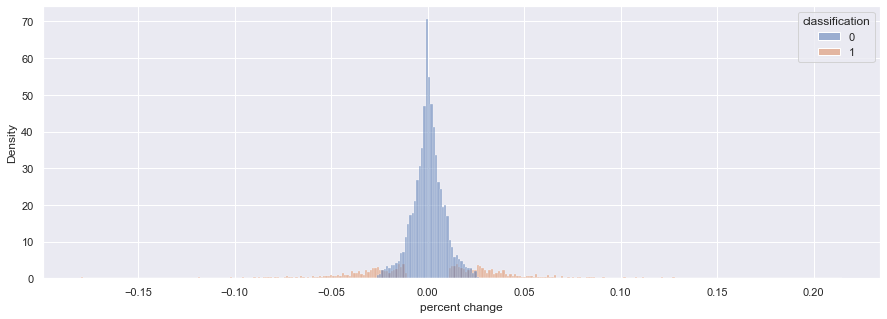

count    8073.000000
mean        0.000673
std         0.019842
min        -0.179500
25%        -0.005421
50%         0.000382
75%         0.006704
max         0.214807
Name: percent change, dtype: float64


In [42]:
# Define user, target, feature names
print('Value Counts:')
print(df[[target_name]].value_counts())
sns.set()
plt.figure(figsize=[15,5])
_ = sns.histplot(data = df, x='percent change', hue=target_name, stat='density')
plt.savefig('./figures/modeling/{}_distribution.png'.format(col_name), bbox_inches='tight')
plt.show()
print(df['percent change'].describe())

This dataset is imbalanced. The positive class (change) makes up only ~18% of data. As we are looking to see if Twitter data can predict that stocks will rise of fall within a certain percentage

In [43]:
%%time
# Clocked at 10min 40s
len_1 = len(df[df[target_name] == 0])
len_2 = len(df[df[target_name] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability = True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6597.000
class 1 size: 1476.000
class weights:  {0: 1, 1: 4.469512195121951}
CPU times: user 6min 4s, sys: 10.6 s, total: 6min 15s
Wall time: 7min 6s


In [44]:
cv_key =  "cv_1"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores


In [45]:
#col_name = 'no change_change'
#cv_key = 'cv_1'
#print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
#print(all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:5].to_markdown())

The top scorer were all from the gradient descent classifier. Because the data are imbalanced, we can add a class_weight to the classifier to see if the results are any better. We will do the same to the Logistic Regression as it typically performs better than gradient descent.

This is a big improvement. Logistic Regression has a better mean F1 and smaller std than the Stochastic Gradient Descent with the weighted scores. However the average fit time is rougly 7x longer. This isn't a problem now, but it will be an issue when we look at hypertuning the parameters. We will look to reducing the data to aid in this.

COLUMN: no change_change 
  CV_KEY: cv_1
richardbranson
Test_roc_auc_mean: 0.810
Test_roc_auc_std: 0.022
Range of test_roc_auc_mean: 0.788 -- 0.831
LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)
The mean cross-validation accuracy is: 0.829 +/- 0.027
Precision: 0.413
Recall: 0.491
Balanced accuracy: 0.695
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       367
           1       0.41      0.49      0.45        53

    accuracy                           0.85       420
   macro avg       0.67      0.69      0.68       420
weighted avg       0.86      0.85      0.85       420



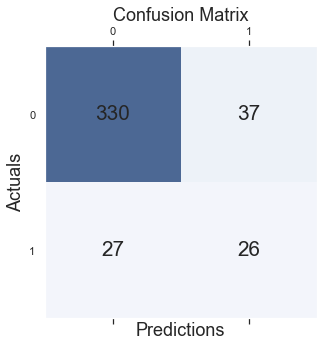

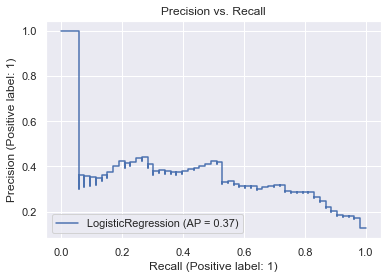

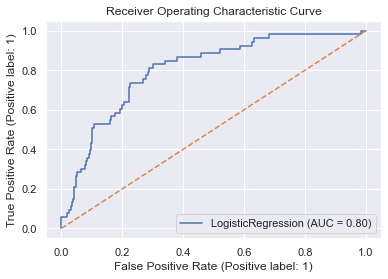

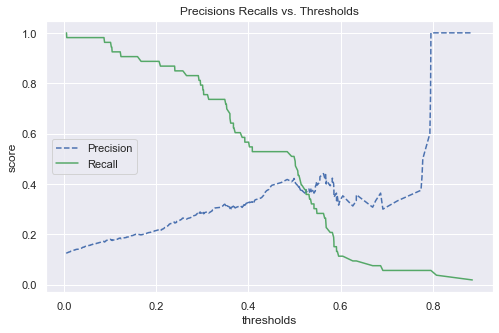

In [46]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

We will look to reduce the dimensions through PCA, TruncatedSVD, and feature selection. 

In [47]:
user = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(df, target_name, numerical_feat, text_name)

In [48]:
chi2_sig(df, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 13
  . top features: serial,handwritten,blow,dip,nik,boundless,bubble,japan,breathtake,conversation
 
# no change:
  . selected features: 13
  . top features: serial,handwritten,blow,dip,nik,boundless,bubble,japan,breathtake,conversation
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 10
  . top features: photos,video,urls,tweet length,number of verbs,number of words,number of stopwords,number of nouns,number of tweets,avg words per sentence
 
# no change:
  . selected features: 10
  . top features: photos,video,urls,tweet length,number of verbs,number of words,number of stopwords,number of nouns,number of tweets,avg words per sentence
 


Value Counts:
classification
0                 1221
1                  178
dtype: int64


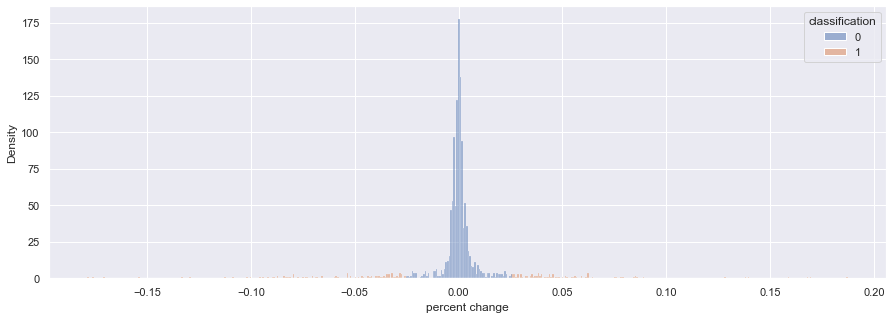

count    1399.000000
mean       -0.000428
std         0.024762
min        -0.178809
25%        -0.002001
50%         0.000000
75%         0.002287
max         0.187531
Name: percent change, dtype: float64
lower no change boundary: -0.025, upper no chnage boundary:0.025


In [49]:
print('Value Counts:')
print(df[[target_name]].value_counts())
sns.set()
plt.figure(figsize=[15,5])
_ = sns.histplot(data = df, x='percent change', hue=target_name, stat='density')
plt.savefig('./figures/modeling/{}_{}_distribution.png'.format(col_name, user), bbox_inches='tight')
plt.show()
print(df['percent change'].describe())
print("lower no change boundary: {:.3f}, upper no chnage boundary:{:.3f}".format(df['percent change'][df[target_name]==0].min(), df['percent change'][df[target_name]==0].max()))

In [50]:
%%time
# Clocked at 9min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(clf,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'saga'}
best score : 0.7919188677259813
COLUMN: no change_change 
  CV_KEY: cv_1
CPU times: user 1min 14s, sys: 10.4 s, total: 1min 24s
Wall time: 7min 23s


In [51]:
chi2_sig(df, bin_name, numerical_feat, 'cleaned')

Statistically Significant Words Per Bin
P_val = 0.95

# change:
  . selected features: 13
  . top features: serial,handwritten,blow,dip,nik,boundless,bubble,japan,breathtake,conversation
 
# no change:
  . selected features: 13
  . top features: serial,handwritten,blow,dip,nik,boundless,bubble,japan,breathtake,conversation
 
Statistically Significant Features Per Bin
P_val = 0.95

# change:
  . selected features: 10
  . top features: photos,video,urls,tweet length,number of verbs,number of words,number of stopwords,number of nouns,number of tweets,avg words per sentence
 
# no change:
  . selected features: 10
  . top features: photos,video,urls,tweet length,number of verbs,number of words,number of stopwords,number of nouns,number of tweets,avg words per sentence
 


In [52]:
model_key =  col_name + '_clf_1'
key = "clf_cv_1"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

LogisticRegression(class_weight={0: 1, 1: 6.859550561797753}, n_jobs=-1,
                   solver='saga')
richardbranson
COLUMN: no change_change
 MODEL_KEY: no change_change_clf_1
 CV_KEY: clf_cv_1
The mean cross-validation accuracy is: 0.800 +/- 0.016
Precision: 0.398
Recall: 0.623
Balanced accuracy: 0.743
              precision    recall  f1-score   support

           0       0.94      0.86      0.90       367
           1       0.40      0.62      0.49        53

    accuracy                           0.83       420
   macro avg       0.67      0.74      0.69       420
weighted avg       0.87      0.83      0.85       420



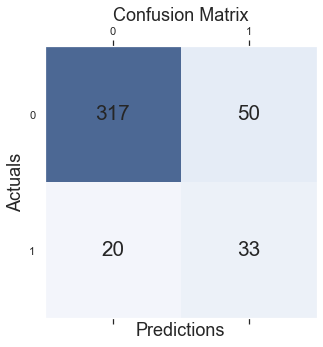

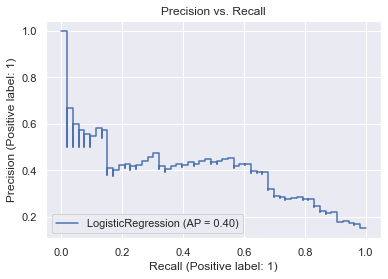

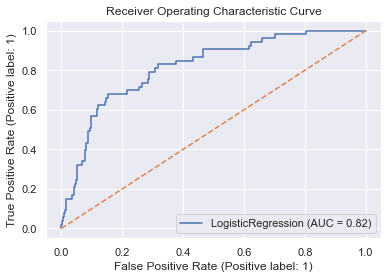

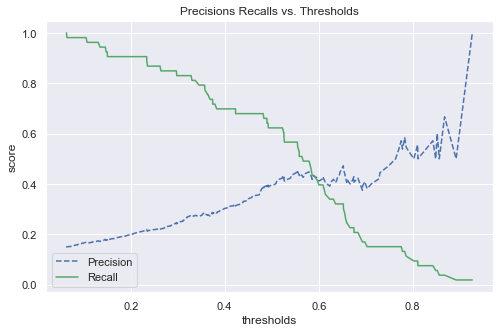

In [53]:
clf = models[model_key].best_estimator_
print(clf)
print(user)
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

# Business-Case Testing and Modeling
In our scenario, an investor would want to see stock changes as quickly as possible, so the twitter features number of replies, retweets, and likes should be discarded as a prediction of new stock price changes on trained on historical data wouldn't have nearly as many counts in those features, and thus aren't a good representation of a real-world application.

In [54]:
numerical_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

df = df_training.copy(deep=True)

text_name = 'cleaned'
col_name = 'no change_change'
target_name = 'classification'

df[target_name] = 0
df[target_name][df[col_name] == labels[1]] = 1

In [55]:
X = df_training[numerical_feat]
features_list = X.columns
y = df_training[bin_name]
clf = RandomForestClassifier(n_jobs=-1)
model = clf.fit(X, y)
most_important_features(model, X, y, features_list)

Important Features:

   avg words per sentence 0.093 +/- 0.003
          number of verbs 0.063 +/- 0.001
             tweet length 0.058 +/- 0.001
                   photos 0.056 +/- 0.001
          number of nouns 0.055 +/- 0.002
      number of stopwords 0.051 +/- 0.002
          number of words 0.049 +/- 0.001
         number of tweets 0.048 +/- 0.002
                     urls 0.042 +/- 0.002
         number of emojis 0.041 +/- 0.001
                    video 0.039 +/- 0.001
                 mentions 0.035 +/- 0.002
  number of organizations 0.021 +/- 0.001
                 hashtags 0.018 +/- 0.001
      number of sentences 0.017 +/- 0.001
                 cashtags 0.001 +/- 0.000


In [56]:
#for user in df['username'].unique():
#    report =df[df['username'] == user].set_index('date').profile_report()
#    report.to_file(output_file="./figures/modeling/{}_case_study_report.html".format(user))

In [57]:
%%time
# Clocked in at 8min 20s
len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

print('class 0 size: {:.3f}'.format(len_1))
print('class 1 size: {:.3f}'.format(len_2))
print('class weights: ', class_weight)

svm = SVC(probability=True, class_weight=class_weight)
lgr = LogisticRegression(n_jobs=-1, class_weight=class_weight)
nb = MultinomialNB()
clf_list = [svm, lgr, nb]

scores = cross_validation_scores(df, target_name, numerical_feat, text_name, clf_list)

class 0 size: 6597.000
class 1 size: 1476.000
class weights:  {0: 1, 1: 4.469512195121951}
CPU times: user 5min 30s, sys: 8.13 s, total: 5min 38s
Wall time: 6min 8s


In [58]:
cv_key =  "cv_3"
scores['n_features'] = len(numerical_feat)
cv_scores[cv_key] = scores
all_scores[col_name] = cv_scores

In [59]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:7]

COLUMN: no change_change 
  CV_KEY: cv_3


,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
0,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",1.199165,0.127691,0.067421,0.000754,0.646718,0.036323,0.356987,0.054420,0.400000,0.074833,0.375261,0.054699,0.797742,0.052478,979,125,16
1,richardbranson,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",7.352844,0.193524,0.980441,0.037056,0.560197,0.041150,0.400000,0.136931,0.152000,0.081976,0.217453,0.104406,0.777316,0.055182,979,125,16
2,richardbranson,MultinomialNB(),0.047987,0.000681,0.067359,0.000201,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.761313,0.066255,979,125,16
3,JohnLegere,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",2.373151,0.197611,0.076715,0.002284,0.555600,0.026758,0.273623,0.029477,0.356234,0.051758,0.308960,0.035748,0.595844,0.026075,1639,337,16
4,JohnLegere,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",27.485566,0.597343,3.989591,0.014827,0.523057,0.013633,0.472143,0.138974,0.065320,0.025019,0.114087,0.041917,0.590945,0.024853,1639,337,16
5,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",1.283772,0.183778,0.064312,0.000154,0.546348,0.031382,0.277778,0.073784,0.240642,0.069255,0.252934,0.058894,0.588046,0.037647,896,166,16
6,Benioff,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",6.819183,0.060322,1.055491,0.016225,0.517997,0.021274,0.358889,0.194904,0.066132,0.032725,0.110485,0.054758,0.582770,0.036592,896,166,16


In [60]:
#col_name = 'no change_change'
#cv_key = 'cv_3'
#print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
#print(all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)[:7].to_markdown())

COLUMN: no change_change 
  CV_KEY: cv_3
richardbranson
Test_roc_auc_mean: 0.798
Test_roc_auc_std: 0.052
Range of test_roc_auc_mean: 0.745 -- 0.850
LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)
The mean cross-validation accuracy is: 0.829 +/- 0.034
Precision: 0.354
Recall: 0.434
Balanced accuracy: 0.660
              precision    recall  f1-score   support

           0       0.92      0.89      0.90       367
           1       0.35      0.43      0.39        53

    accuracy                           0.83       420
   macro avg       0.63      0.66      0.65       420
weighted avg       0.84      0.83      0.84       420



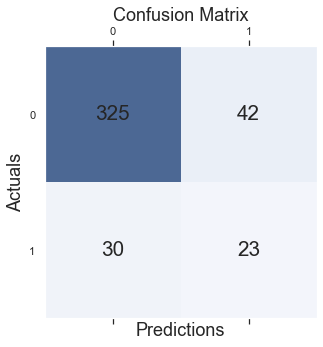

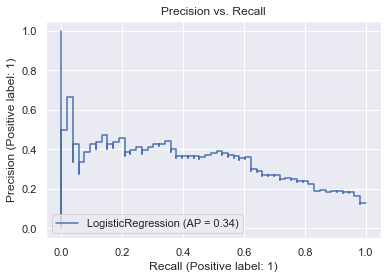

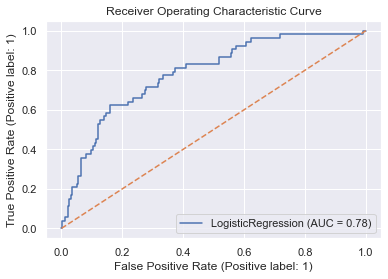

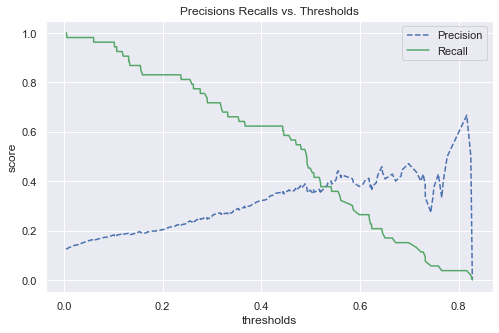

In [61]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=0, reduce=False)

COLUMN: no change_change 
  CV_KEY: cv_3
richardbranson
Test_roc_auc_mean: 0.777
Test_roc_auc_std: 0.055
Range of test_roc_auc_mean: 0.722 -- 0.832
SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)
The mean cross-validation accuracy is: 0.865 +/- 0.008
Precision: 0.364
Recall: 0.151
Balanced accuracy: 0.556
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       367
           1       0.36      0.15      0.21        53

    accuracy                           0.86       420
   macro avg       0.63      0.56      0.57       420
weighted avg       0.82      0.86      0.83       420



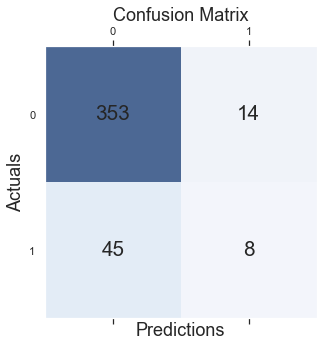

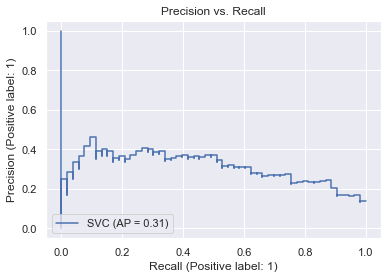

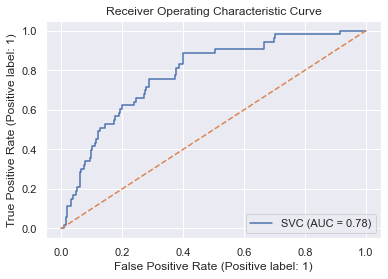

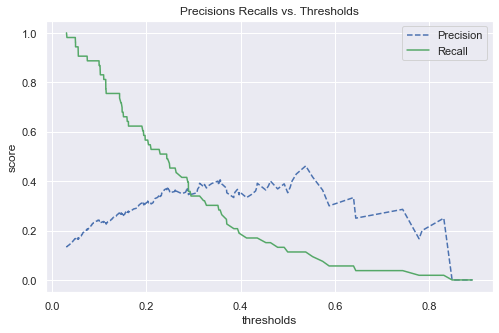

In [62]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=1, reduce=False)

The models are fairly similar, but the recall from the logistic regression is better than the support vector machines. The precision is reversed, but we are looking to optimize recall, and looking at the precisions, recalls, and thresholds indicates model optimization would be better with logistic regression

In [63]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)

COLUMN: no change_change 
  CV_KEY: cv_3


,username,model,fit_time_mean,fit_time_std,score_time_mean,score_time_std,test_balanced_accuracy_mean,test_balanced_accuracy_std,test_precision_mean,test_precision_std,test_recall_mean,test_recall_std,test_f1_mean,test_f1_std,test_roc_auc_mean,test_roc_auc_std,n_samples,n_pos_label,n_features
0,richardbranson,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",1.199165,0.127691,0.067421,0.000754,0.646718,0.036323,0.356987,0.054420,0.400000,0.074833,0.375261,0.054699,0.797742,0.052478,979,125,16
1,richardbranson,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",7.352844,0.193524,0.980441,0.037056,0.560197,0.041150,0.400000,0.136931,0.152000,0.081976,0.217453,0.104406,0.777316,0.055182,979,125,16
2,richardbranson,MultinomialNB(),0.047987,0.000681,0.067359,0.000201,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.761313,0.066255,979,125,16
3,JohnLegere,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",2.373151,0.197611,0.076715,0.002284,0.555600,0.026758,0.273623,0.029477,0.356234,0.051758,0.308960,0.035748,0.595844,0.026075,1639,337,16
4,JohnLegere,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",27.485566,0.597343,3.989591,0.014827,0.523057,0.013633,0.472143,0.138974,0.065320,0.025019,0.114087,0.041917,0.590945,0.024853,1639,337,16
5,Benioff,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",1.283772,0.183778,0.064312,0.000154,0.546348,0.031382,0.277778,0.073784,0.240642,0.069255,0.252934,0.058894,0.588046,0.037647,896,166,16
6,Benioff,"SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)",6.819183,0.060322,1.055491,0.016225,0.517997,0.021274,0.358889,0.194904,0.066132,0.032725,0.110485,0.054758,0.582770,0.036592,896,166,16
7,JohnLegere,MultinomialNB(),0.064307,0.000609,0.076337,0.000552,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.558235,0.046083,1639,337,16
8,jack,MultinomialNB(),0.025852,0.000144,0.042261,0.000755,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.540209,0.072056,642,101,16
9,jack,"LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1)",0.527839,0.182714,0.044286,0.000946,0.509451,0.042129,0.195098,0.108115,0.109524,0.065746,0.138145,0.078177,0.520728,0.009717,642,101,16


COLUMN: no change_change 
  CV_KEY: cv_3
Benioff
Test_roc_auc_mean: 0.583
Test_roc_auc_std: 0.037
Range of test_roc_auc_mean: 0.546 -- 0.619
SVC(class_weight={0: 1, 1: 4.469512195121951}, probability=True)
The mean cross-validation accuracy is: 0.794 +/- 0.005
Precision: 0.294
Recall: 0.070
Balanced accuracy: 0.516
              precision    recall  f1-score   support

           0       0.82      0.96      0.89       314
           1       0.29      0.07      0.11        71

    accuracy                           0.80       385
   macro avg       0.56      0.52      0.50       385
weighted avg       0.72      0.80      0.74       385



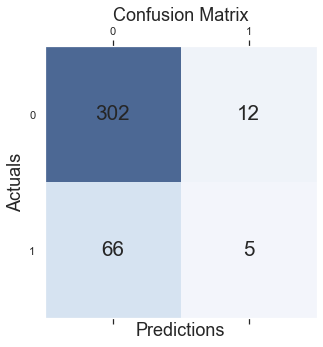

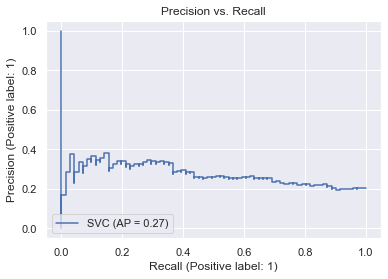

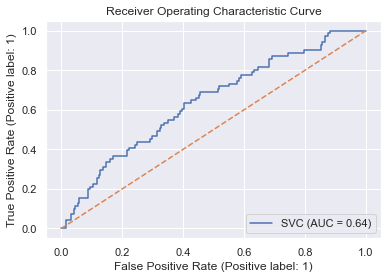

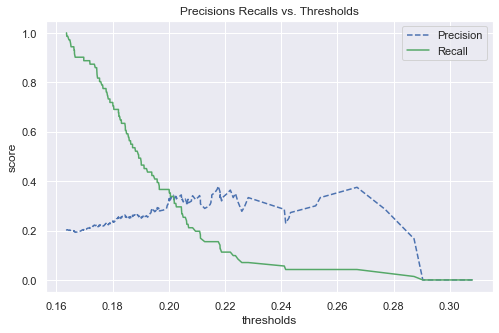

In [64]:
scorer = 'test_roc_auc'
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
_ = examine_model(df, all_scores[col_name][cv_key], scorer, target_name, numerical_feat, pos=6, reduce=False)

In [65]:
print("COLUMN: {} \n  CV_KEY: {}".format(col_name, cv_key))
user = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['username'][0]
clf = all_scores[col_name][cv_key].sort_values(by='test_roc_auc_mean', ascending=False).reset_index(drop=True)['model'][0]
df = df[df['username'] == user].copy(deep=True)
X, y = make_xy(
    df,
    target_name,
    numerical_feat,
    text_name,
    min_df=1,
    ngram_range=(1, 1),
    decomp=False,
)

COLUMN: no change_change 
  CV_KEY: cv_3


In [66]:
X_import = df[numerical_feat]
features_list = X_import.columns
y_import = df[bin_name]
clf = RandomForestClassifier(n_jobs=-1)
model = clf.fit(X_import, y_import)
most_important_features(model, X_import, y_import, features_list)

Important Features:

                   photos 0.054 +/- 0.004
      number of stopwords 0.040 +/- 0.003
             tweet length 0.036 +/- 0.003
          number of verbs 0.035 +/- 0.002
   avg words per sentence 0.032 +/- 0.003
                     urls 0.031 +/- 0.003
          number of words 0.027 +/- 0.002
          number of nouns 0.022 +/- 0.003
                 mentions 0.020 +/- 0.002
                 hashtags 0.019 +/- 0.003
                    video 0.017 +/- 0.001
         number of tweets 0.012 +/- 0.002
      number of sentences 0.005 +/- 0.001
  number of organizations 0.003 +/- 0.001


In [67]:
%%time
# Clocked at 9min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(df[df['classification'] == 0])
len_2 = len(df[df['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}

# Separate into Training/Testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify=y)
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.7894663965765197
CPU times: user 1min 13s, sys: 10.3 s, total: 1min 23s
Wall time: 7min 19s


In [68]:
model_key =  col_name + '_clf_2'
key = "clf_cv_2"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_2
 CV_KEY: clf_cv_2
richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.834 +/- 0.022
Precision: 0.450
Recall: 0.509
Balanced accuracy: 0.710
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       367
           1       0.45      0.51      0.48        53

    accuracy                           0.86       420
   macro avg       0.69      0.71      0.70       420
weighted avg       0.87      0.86      0.86       420



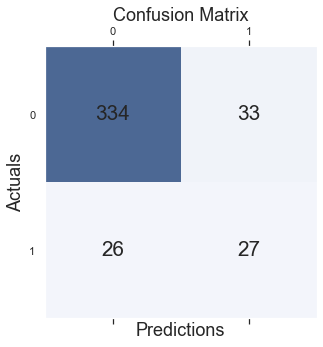

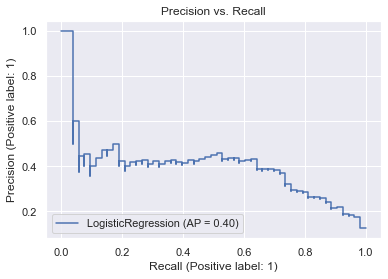

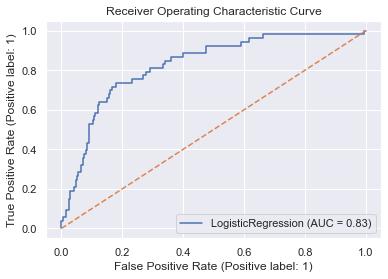

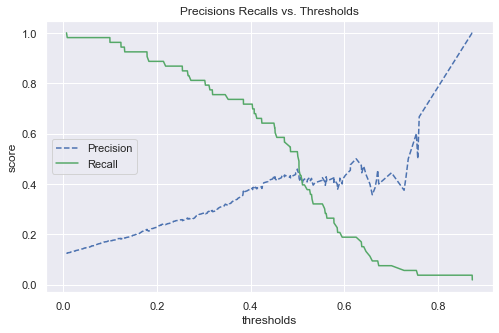

In [69]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Threshold: 0.403


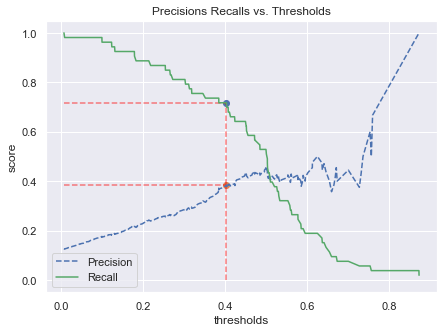

              precision    recall  f1-score   support

           0       0.95      0.83      0.89       367
           1       0.38      0.72      0.50        53

    accuracy                           0.82       420
   macro avg       0.67      0.78      0.69       420
weighted avg       0.88      0.82      0.84       420



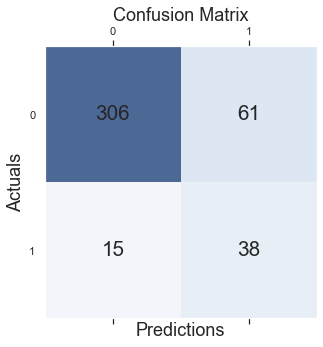

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 38.729%

  How often is it wrong?
  Error Rate: -37.729%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 71.698%

  When it predicts yes, how often is it correct?
  Precision: 38.384%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 16.621%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 83.379%
  F1 Score: 0.500
  Weighted F1 Score (beta = 2): 0.611
  G-mean: 0.525


In [70]:
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.7)

y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Testing Model and Interpretability

In [71]:
case_study_feat = ['mentions',
 'hashtags',
 'cashtags',
 'video',
 'photos',
 'urls',
 'number of tweets',
 'number of emojis',
 'tweet length',
 'number of sentences',
 'number of words',
 'avg words per sentence',
 'number of nouns',
 'number of verbs',
 'number of stopwords',
 'number of organizations']

In [72]:
# Separate Training from Testing
train_data = df_training.copy(deep=True)
train_data = train_data[train_data['username']==user]
test_data = df_testing.copy(deep=True)
test_data = test_data[test_data['username']==user]
train_data.reset_index(inplace=True, drop=True)
train_idx = train_data.index
start = len(train_data)
stop = len(train_data)+len(test_data)
test_idx = np.arange(start, stop)
test_data.index = test_idx

numerical_feat = case_study_feat.copy()
target_name = 'classification'
text_name = 'cleaned'
col_name = 'no change_change' 
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]

train_data[target_name] = 0
train_data[target_name][train_data[col_name] == labels[1]] = 1


test_data[target_name] = 0
test_data[target_name][test_data[col_name] == labels[1]] = 1


df = pd.concat([train_data, test_data])


# Get bins and calculate class_weight on training data


In [73]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X, y = make_xy(df,
    target_name,
    numerical_feat,
    text_name
)

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 1.0, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.8035688992376905
CPU times: user 1min 30s, sys: 14.3 s, total: 1min 44s
Wall time: 11min 22s


In [74]:
model_key =  col_name + '_clf_test'
key = "clf_cv_test"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_test
 CV_KEY: clf_cv_test
richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.832 +/- 0.018
Precision: 0.312
Recall: 0.461
Balanced accuracy: 0.658
              precision    recall  f1-score   support

           0       0.92      0.86      0.89       534
           1       0.31      0.46      0.37        76

    accuracy                           0.81       610
   macro avg       0.62      0.66      0.63       610
weighted avg       0.84      0.81      0.82       610



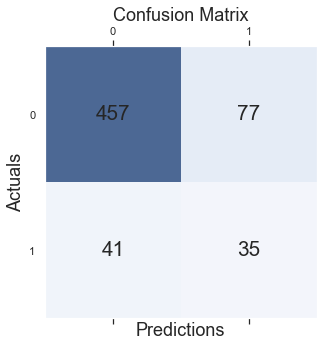

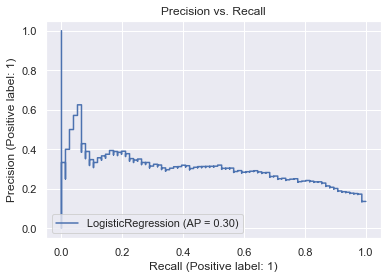

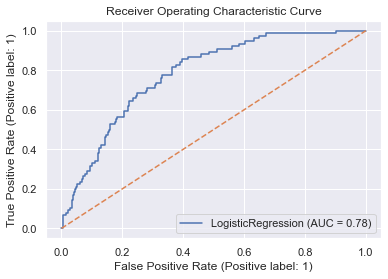

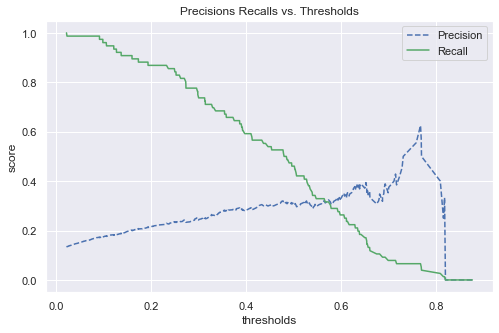

In [75]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

Threshold: 0.273


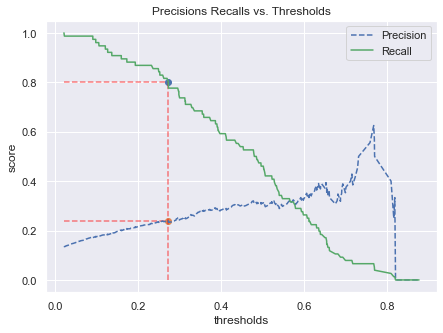

richardbranson
LogisticRegression(class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1,
                   solver='liblinear')
              precision    recall  f1-score   support

           0       0.96      0.64      0.76       534
           1       0.24      0.80      0.37        76

    accuracy                           0.66       610
   macro avg       0.60      0.72      0.57       610
weighted avg       0.87      0.66      0.72       610



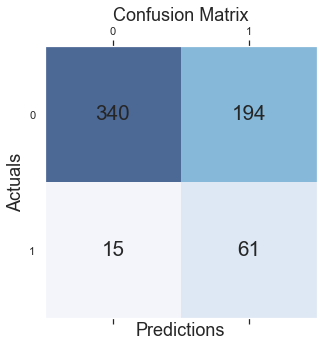

  Confusion Matrix Metrics
  How often is the classifier correct?
  Accuracy: 61.557%

  How often is it wrong?
  Error Rate: -60.557%

  When it's actually yes, how often does it predict yes?
  True Positive Rate (Recall): 80.263%

  When it predicts yes, how often is it correct?
  Precision: 23.922%

  When it's actually no, how often does it predict yes?
  False Positive Rate: 36.330%

  When it's actually no, how often does it predict no?
  True Negative Rate (Specificity): 63.670%
  F1 Score: 0.369
  Weighted F1 Score (beta = 2): 0.546
  G-mean: 0.438


In [76]:
# default threshold is 0.5
thresh = plot_threshold(precisions, recalls, thresholds, clf, recall_thresh=0.80)
print(user)
print(clf)
y_pred = (clf.predict_proba(X_test)[:,1] >= thresh).astype(int)
print(classification_report(y_test, y_pred))
plot_confusion_matrix(y_test, y_pred, show_metrics=True)

# Interpretation

In [77]:
most_predictive_words(clf, train_data['cleaned'], train_data[target_name], min_df=2)


 Most Predictive Words for bin: 0
     
                 way 0.84
                huge 0.84
                come 0.84
                luck 0.86
                know 0.86
                need 0.87
             support 0.88
               think 0.90
                 not 0.95
               quote 0.97

 Most Predictive Words for bin: 1
     
              design 0.75
           encourage 0.76
           wonderful 0.76
                word 0.76
                song 0.77
               space 0.77
      congratulation 0.78
         interesting 0.79
        conversation 0.84
             thought 0.90




In [78]:
target_word = 'spaceflight'
i = get_index(test_data['cleaned'], target_word)
test_data['tweet'].loc[i]

'2... @VirginUnite @TheElders Wonderful to see. #StateOfHope @HollyBranson @VirginUnite @thebteamhq Incredible work. Come behind the scenes of #Unity22 as @virgingalactic spaceship VSS Unity joins forces with our mothership VMS Eve. Watch our spaceflight livestream this Sunday at 6am PT / 9am ET / 2pm BST  https://t.co/alyOz5Xryn @PaulPolman @virgingalactic Thanks so much Paul @Cmdr_Hadfield Thanks Chris. Feeling good. @jeweljk @virgingalactic Thank you Jewel! @adambain @KatColeATL @virgingalactic Thank you all! @VirginVoyages @virgingalactic What a crew #Unity22'

[[0.70086119 0.29913881]]
Document id: 1413
Percent Change: -0.033
Probability(Change) = 0.470
True class: change


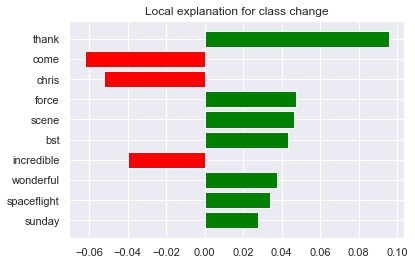

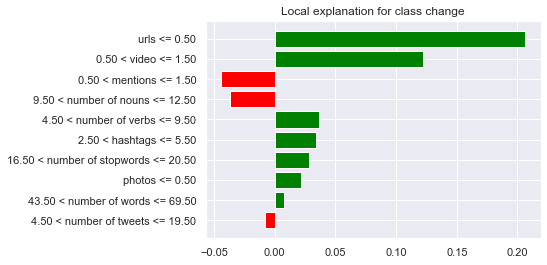

In [79]:
idx = i
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [80]:
classifications = pd.DataFrame()
classifications['actual'] = y_test.copy(deep=True)
classifications['percent change'] = test_data['percent change']
classifications['y_pred'] = y_pred
classifications['y_proba_1'] = y_proba[:,1]
misclassifications = classifications[classifications['actual'] != classifications['y_pred']]
correct_classifications = classifications[classifications['actual'] == classifications['y_pred']]
print('Misclassified change as no change {} times'.format(len(misclassifications[misclassifications['actual'] == 1])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1')[:5]

Misclassified change as no change 15 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1579,1,0.047939,0,0.021735
1700,1,0.069886,0,0.091201
1741,1,-0.027885,0,0.098295
1493,1,0.090431,0,0.105452
1866,1,0.028053,0,0.121271


In [81]:
test_data['tweet'].loc[1737]

'It’s so important to push yourself in life beyond what you think your limits are – and a lot of it is down to your mind and not your body in the end  https://t.co/LZTRH2rY2N  https://t.co/sZN8mmcd1R As I was coming up on one of the steepest climbs I heard one of the guys say ‘God I wish I was at home’ – but sitting down for dinner in the evening he was so satisfied he’d managed to pull it off  https://t.co/LZTRH2rY2N  https://t.co/QVPxcjmOnW So overwhelmed with such a feeling of pure joy when we made it to the top of the mountain that I picked up my bike and held it over my head in triumph  https://t.co/LZTRH2rY2N  https://t.co/GVQ0RFBP3W In five days we have cycled twice the height of Everest and more than 500km for the @virgin @strivechallenge  https://t.co/LZTRH2rY2N  https://t.co/lRvARaEJ84 My top 10 quotes on breaking barriers  https://t.co/MMtomJvXU5  https://t.co/uvMBeqWPDw Wishing Freddie the best of clucks in his new role at @VirginAtlantic  https://t.co/zNwKz6d2hU  https://t

[[0.70086119 0.29913881]]
Document id: 1579
Percent Change: 0.048
Probability(Change) = 0.341
True class: change


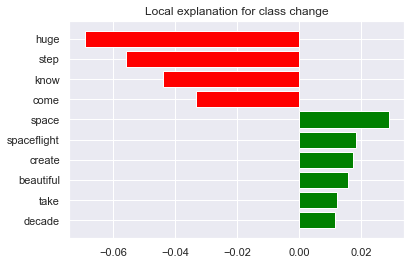

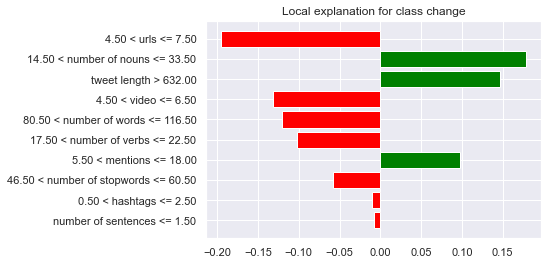

In [83]:
idx = misclassifications[misclassifications['actual'] == 1].sort_values(by='y_proba_1').index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [84]:
print('Misclassified no change as change {} times'.format(len(misclassifications[misclassifications['actual'] == 0])))
print('Top 5 misclassifications')
misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False)[:5]

Misclassified no change as change 194 times
Top 5 misclassifications


,actual,percent change,y_pred,y_proba_1
1775,0,-0.000192,1,0.876482
1750,0,0.015534,1,0.819904
1733,0,0.001235,1,0.815694
1729,0,0.005826,1,0.758403
1755,0,-0.001908,1,0.730989


[[0.70086119 0.29913881]]
Document id: 1579
Percent Change: 0.048
Probability(Change) = 0.341
True class: change


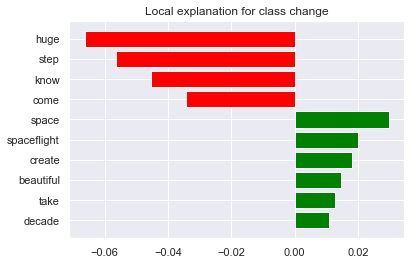

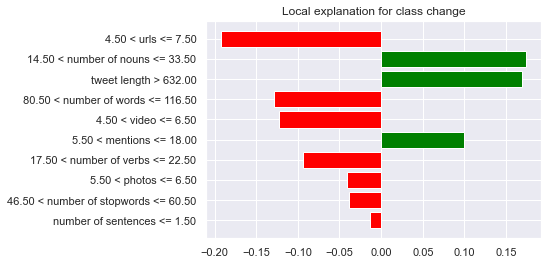

In [85]:
#### idx = misclassifications[misclassifications['actual'] == 0].sort_values(by='y_proba_1', ascending=False).index[0]
class_names = ['no change', 'change']
interpret_instance(clf, train_data, test_data, class_names, idx, numerical_feat, 10)

In [86]:
classifications

,actual,percent change,y_pred,y_proba_1
1399,0,0.007925,1,0.487622
1400,0,-0.002976,0,0.030400
1401,0,-0.005020,0,0.041861
1402,0,-0.002000,1,0.289087
1403,1,0.040000,1,0.503344
...,...,...,...,...
2004,0,0.001980,0,0.050305
2005,0,-0.005964,0,0.008105
2006,0,-0.000995,0,0.106769
2007,0,-0.000329,0,0.028043


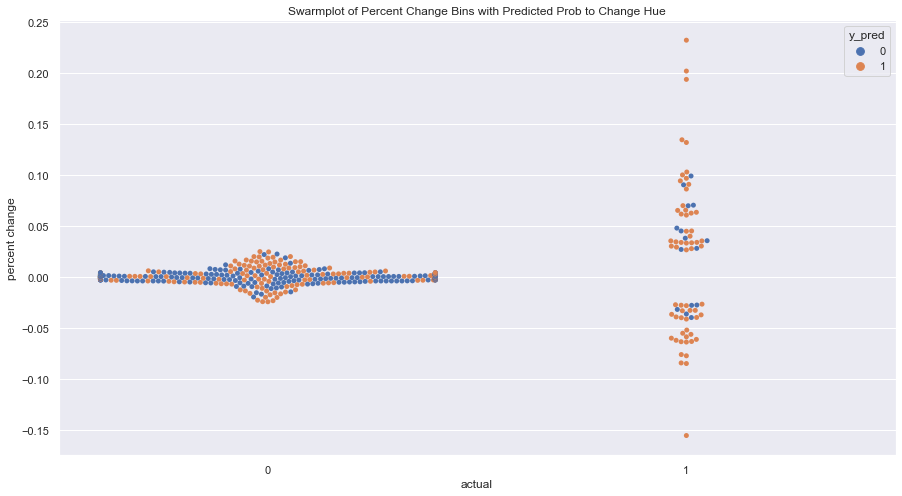

In [87]:
sns.set()
fig, ax = plt.subplots(figsize=(15,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_pred", data=classifications, size=5)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())

# Remove the legend and add a colorbar
ax.get_legend()
plt.title('Swarmplot of Percent Change Bins with Predicted Prob to Change Hue')
plt.savefig('./figures/modeling/swarmplot_cat.png', bbox_inches='tight')

plt.show()

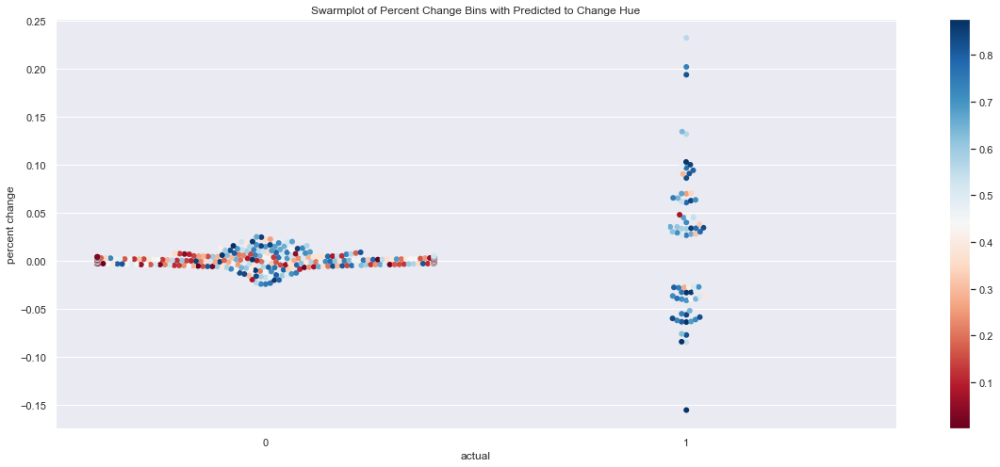

In [88]:
#### sns.set()
fig, ax = plt.subplots(figsize=(20,8))
ax = sns.swarmplot(y="percent change", x='actual', hue="y_proba_1", palette='RdBu', data=classifications, size=6)
norm = plt.Normalize(classifications['y_proba_1'].min(), classifications['y_proba_1'].max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
ax.figure.colorbar(sm)
plt.title('Swarmplot of Percent Change Bins with Predicted to Change Hue')
plt.savefig('./figures/modeling/swarmplot_pred.png', bbox_inches='tight')

plt.show()

In [89]:
for user in list(tweet_stocks['username'].unique()):
    print(user.upper())
    chi2_sig(tweet_stocks[tweet_stocks['username'] == user], 'bins', numerical_feat, 'cleaned')

ELONMUSK
Statistically Significant Words Per Bin
P_val = 0.95

# drop:
  . selected features: 34
  . top features: strawberry,insightful,grateful,forever,adams,douglas,zenit,bridge,selling,monica
 
# no change:
  . selected features: 0
  . top features: 
 
# rise:
  . selected features: 20
  . top features: lhc,savage,exposure,professor,doug,yay,dome,wand,lifemonth,cheese
 
Statistically Significant Features Per Bin
P_val = 0.95

# drop:
  . selected features: 0
  . top features: 
 
# no change:
  . selected features: 0
  . top features: 
 
# rise:
  . selected features: 0
  . top features: 
 
LEVIE
Statistically Significant Words Per Bin
P_val = 0.95

# drop:
  . selected features: 35
  . top features: bluetooth,infinity,strange,childhood,stress,disaster,bored,neighborhood,nice,garage
 
# no change:
  . selected features: 4
  . top features: cat,content,bluetooth,measure
 
# rise:
  . selected features: 25
  . top features: tab,blog,disastrous,january,heist,nft,bathtub,process,death,t

In [90]:
# Plot percent change with y_proba hue00

# Just words

In [91]:
numerical_feat = case_study_feat.copy()
target_name = 'classification'
text_name = 'cleaned'
col_name = 'no change_change' 
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]

train_data[target_name] = 0
train_data[target_name][train_data[col_name] == labels[1]] = 1


test_data[target_name] = 0
test_data[target_name][test_data[col_name] == labels[1]] = 1


df = pd.concat([train_data, test_data])

In [92]:
%%time
# Clocked at 3min 20s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X = df[numerical_feat]
y = df[target_name]

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]

scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(X_train)
scaled = scaler.fit_transform(X_test)

X_test = pd.DataFrame(scaled, columns=X.columns)

# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 0.1, 'dual': False, 'penalty': 'l1', 'solver': 'liblinear'}
best score : 0.7815993210558914
CPU times: user 9.22 s, sys: 118 ms, total: 9.34 s
Wall time: 13.1 s


In [93]:
model_key =  col_name + '_clf_feat'
key = "clf_cv_feat"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_feat
 CV_KEY: clf_cv_feat
richardbranson
LogisticRegression(C=0.1, class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1,
                   penalty='l1', solver='liblinear')
The mean cross-validation accuracy is: 0.762 +/- 0.015
Precision: 0.125
Recall: 1.000
Balanced accuracy: 0.500
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       534
           1       0.12      1.00      0.22        76

    accuracy                           0.12       610
   macro avg       0.06      0.50      0.11       610
weighted avg       0.02      0.12      0.03       610



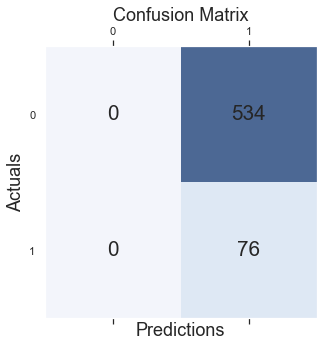

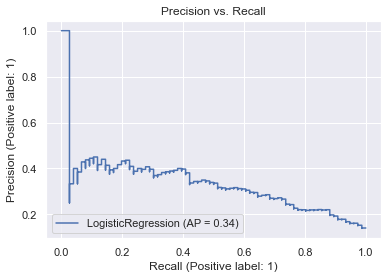

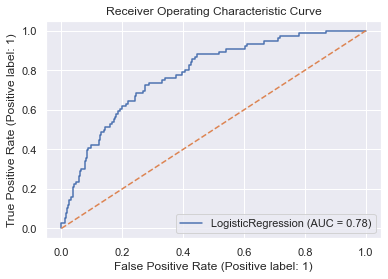

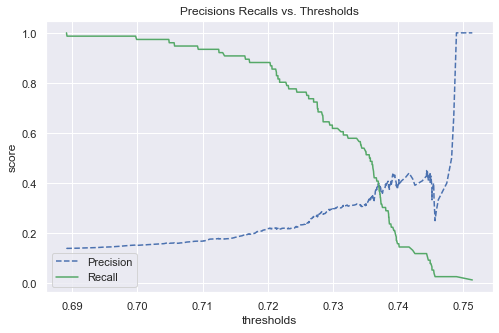

In [94]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)

# Just words

In [95]:
class_weight

{0: 1, 1: 6.859550561797753}

In [96]:
%%time
# Clocked at 12min 51s
grid={
    "C":np.logspace(-3,3,7), "penalty":["l1","l2"], "dual":[False, True],
    "solver" : ['liblinear', 'saga']
} 

len_1 = len(train_data[train_data['classification'] == 0])
len_2 = len(train_data[train_data['classification'] == 1])
class_weight = {0:1, 1:(len_1/len_2)}


X = df[text_name]
y = df[target_name]

vectorizer = TfidfVectorizer()
sparse_text_matrix = vectorizer.fit_transform(X)

X = pd.DataFrame(sparse_text_matrix.toarray(), columns=vectorizer.get_feature_names())

X_train = X.loc[train_idx]
X_test = X.loc[test_idx]
y_train = y.loc[train_idx]
y_test = y.loc[test_idx]





# Separate into Training/Testing
scoring = 'roc_auc'
clf = LogisticRegression(n_jobs=-1, class_weight=class_weight)
clf_cv=GridSearchCV(lgr,grid,cv=10, scoring=scoring)
clf_cv.fit(X_train,y_train)

print("tuned hyperparameters :(best parameters) ",clf_cv.best_params_)
print("best score :",clf_cv.best_score_)

tuned hyperparameters :(best parameters)  {'C': 0.01, 'dual': False, 'penalty': 'l2', 'solver': 'liblinear'}
best score : 0.7116819938691189
CPU times: user 1min 10s, sys: 10.9 s, total: 1min 21s
Wall time: 11min 27s


In [97]:
model_key =  col_name + '_clf_text'
key = "clf_cv_text"

# Save Results
models[model_key] = clf_cv

lgr_params = pd.DataFrame(clf_cv.cv_results_)
lgr_params['username'] = user
lgr_params['scoring'] = scoring
lgr_params['n_class_0'] = len_1
lgr_params['n_class_1'] = len_2

cv_scores[key] = lgr_params

all_scores[col_name] = cv_scores

COLUMN: no change_change
 MODEL_KEY: no change_change_clf_text
 CV_KEY: clf_cv_text
richardbranson
LogisticRegression(C=0.01, class_weight={0: 1, 1: 4.469512195121951}, n_jobs=-1,
                   solver='liblinear')
The mean cross-validation accuracy is: 0.873 +/- 0.002
Precision: 0.000
Recall: 0.000
Balanced accuracy: 0.500
              precision    recall  f1-score   support

           0       0.88      1.00      0.93       534
           1       0.00      0.00      0.00        76

    accuracy                           0.88       610
   macro avg       0.44      0.50      0.47       610
weighted avg       0.77      0.88      0.82       610



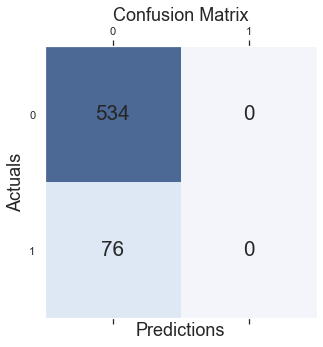

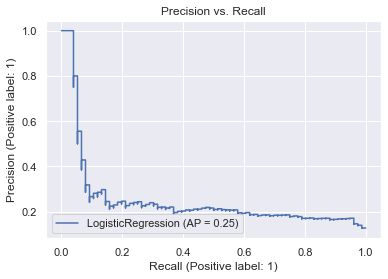

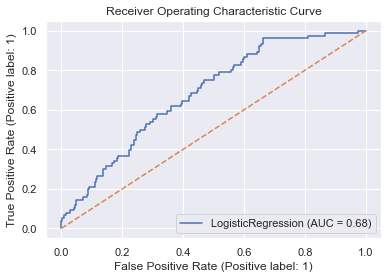

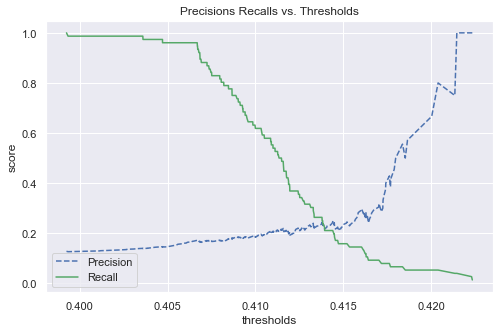

In [98]:
clf = models[model_key].best_estimator_
print("COLUMN: {}\n MODEL_KEY: {}\n CV_KEY: {}".format(col_name, model_key, key))
user = all_scores[col_name][key].sort_values(by='rank_test_score')['username'].iloc[0]
print(user)
print(clf)
full_report(clf, X_train, X_test, y_train, y_test)
y_proba = clf.predict_proba(X_test)
precisions, recalls, thresholds = precision_recall_curve(y_test, y_proba[:,1])
plt.figure(figsize=[8,5])
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)